# CNN model

# 1. Import Packages

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from pathlib import Path
import os
from PIL import Image

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, Flatten, Dense, Dropout, Activation, BatchNormalization
from keras.models import Model
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report

In [1]:
# For Google Colab use:
import kagglehub
# Download latest version
path = kagglehub.dataset_download("alessiocorrado99/animals10")
print("Path to dataset files:", path)

100%|██████████| 586M/586M [00:15<00:00, 40.5MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/alessiocorrado99/animals10/versions/2


# 2. Read Data

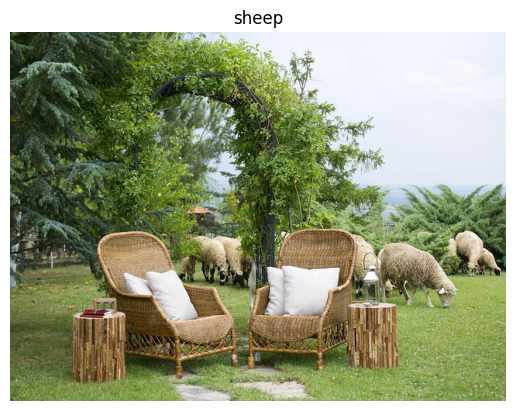

In [5]:
# Load the data
def convert_path_to_df(dataset):
    image_dir = Path(dataset)

    # Get filepaths and labels
    filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.jpeg')) + list(image_dir.glob(r'**/*.PNG'))

    labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

    filepaths = pd.Series(filepaths, name='Filepath').astype(str)
    labels = pd.Series(labels, name='Label')

    # Concatenate filepaths and labels
    image_df = pd.concat([filepaths, labels], axis=1)
    return image_df

#dataset = "./AnimalRecognition_Data" # VSCode
dataset = path # Google Colab
image_df = convert_path_to_df(dataset)
translate = {"cane": "dog", "cavallo": "horse", "elefante": "elephant", "farfalla": "butterfly", "gallina": "chicken", "gatto": "cat", "mucca": "cow", "pecora": "sheep", "scoiattolo": "squirrel", "ragno":"spider"}
image_df['Label'] = image_df['Label'].map(translate)

# Plot the first image in the dataframe
img_path = image_df.Filepath.iloc[0]
img = Image.open(img_path)
plt.imshow(img)
plt.title(image_df.Label.iloc[0])
plt.axis('off')
plt.show()

Label
dog          4863
spider       4819
chicken      3098
horse        2623
butterfly    2072
cow          1866
squirrel     1862
sheep        1820
cat          1667
elephant     1438
Name: count, dtype: int64


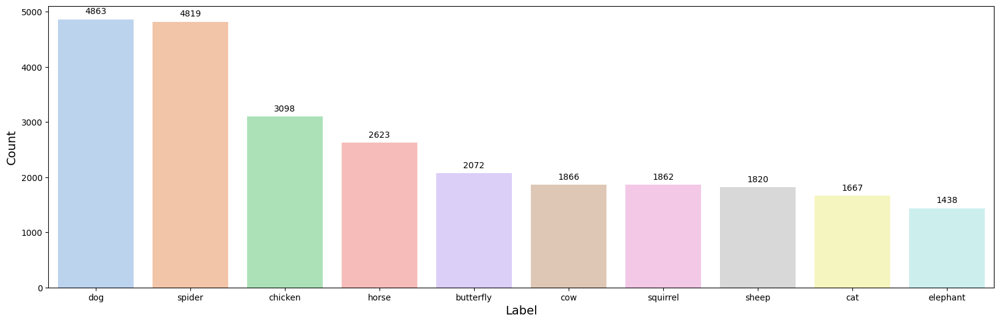

In [ ]:
# Get the value counts for each label
label_counts = image_df['Label'].value_counts()
print(label_counts)

# Create the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 6))

# Plot the bar chart
sns.barplot(x=label_counts.index, y=label_counts.values, hue=label_counts.index, alpha=0.8, palette='pastel', ax=axes, legend=False)
# axes.set_title('Distribution of Labels in Image Dataset', fontsize=16)
axes.set_xlabel('Label', fontsize=14)
axes.set_ylabel('Count', fontsize=14)

# Add count labels on top of the bars
for p in axes.patches:
    axes.annotate(format(p.get_height(), '.0f'),
                  (p.get_x() + p.get_width() / 2., p.get_height()),
                  ha = 'center', va = 'center',
                  xytext = (0, 9),
                  textcoords = 'offset points')

# Display the plot
plt.show()

<ipython-input-5-9863aacf3c7d>:3: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  image_df_balanced = image_df.groupby('Label').apply(lambda x: x.sample(min_count, random_state=42)).reset_index(drop=True)


Label
butterfly    1438
cat          1438
chicken      1438
cow          1438
dog          1438
elephant     1438
horse        1438
sheep        1438
spider       1438
squirrel     1438
Name: count, dtype: int64


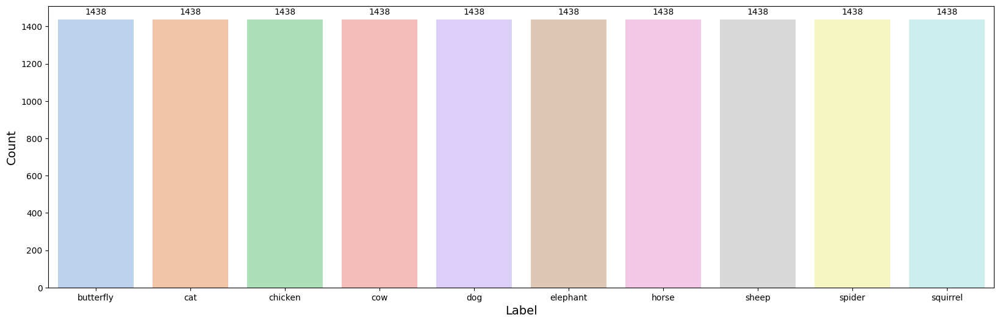

In [ ]:
# # Balance dataset
min_count = image_df['Label'].value_counts().min()
image_df_balanced = image_df.groupby('Label').apply(lambda x: x.sample(min_count, random_state=42)).reset_index(drop=True)

# Get the value counts for each label
label_counts = image_df_balanced['Label'].value_counts()
print(label_counts)

# Create the figure and axes
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(20, 6))

# Plot the bar chart
sns.barplot(x=label_counts.index, y=label_counts.values, hue=label_counts.index, alpha=0.8, palette='pastel', ax=axes, legend=False)
# axes.set_title('Distribution of Labels in Image Dataset', fontsize=16)
axes.set_xlabel('Label', fontsize=14)
axes.set_ylabel('Count', fontsize=14)

# Add count labels on top of the bars
for p in axes.patches:
    axes.annotate(format(p.get_height(), '.0f'),
                  (p.get_x() + p.get_width() / 2., p.get_height()),
                  ha = 'center', va = 'center',
                  xytext = (0, 9),
                  textcoords = 'offset points')

# 3. CNN

## 3.1 Model of MLLB class

In [ ]:
# Pre-processing steps
# Balance dataset
min_count = image_df['Label'].value_counts().min()
image_df_balanced = image_df.groupby('Label').apply(lambda x: x.sample(min_count, random_state=42)).reset_index(drop=True)

# Separate in train and test data
train_df, test_df = train_test_split(image_df_balanced, test_size=0.2, shuffle=True, random_state=42)

# Define image size and batch size
img_height, img_width = 128, 128
batch_size = 32

# Create an ImageDataGenerator for data augmentation
train_generator = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

test_generator = ImageDataGenerator(
    rescale=1./255
)

# Split the data into three categories
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(img_height, img_width),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True,
    subset='training'
)

validation_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(img_height, img_width),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(img_height, img_width),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False
)

Found 9204 validated image filenames belonging to 10 classes.
Found 2300 validated image filenames belonging to 10 classes.
Found 2876 validated image filenames belonging to 10 classes.


<ipython-input-11-8ca64c85a457>:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  image_df_balanced = image_df.groupby('Label').apply(lambda x: x.sample(min_count, random_state=42)).reset_index(drop=True)


In [ ]:
# Define the CNN model
model = Sequential()

# Convolution Layer 1
model.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model.add(BatchNormalization(axis=-1))
model.add(Activation('relu'))

# Convolution Layer 2
model.add(Conv2D(32, (3, 3)))
model.add(BatchNormalization(axis=-1))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model.add(Conv2D(64, (3, 3)))
model.add(BatchNormalization(axis=-1))
model.add(Activation('relu'))

# Convolution Layer 4
model.add(Conv2D(64, (3, 3)))
model.add(BatchNormalization(axis=-1))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())

# Fully Connected Layer 5
model.add(Dense(512))
model.add(BatchNormalization())
model.add(Activation('relu'))

# Fully Connected Layer 6
model.add(Dropout(0.2))
model.add(Dense(len(translate)))
model.add(Activation('softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 124, 124, 32)        │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 124, 124, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 124, 124, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 62, 62, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 60, 60, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 60, 60, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 60, 60, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 58, 58, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 58, 58, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 58, 58, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 29, 29, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 53824)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │      27,558,400 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │              

 Total params: 27,631,914 (105.41 MB)

 Trainable params: 27,630,506 (105.40 MB)

 Non-trainable params: 1,408 (5.50 KB)

In [ ]:
# Train the model
history = model.fit(
    train_images,
    validation_data=validation_images,
    epochs=10
)

Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


288/288 ━━━━━━━━━━━━━━━━━━━━ 45s 111ms/step - accuracy: 0.3209 - loss: 2.0713 - val_accuracy: 0.1491 - val_loss: 3.7282
Epoch 2/10
288/288 ━━━━━━━━━━━━━━━━━━━━ 25s 85ms/step - accuracy: 0.5928 - loss: 1.2026 - val_accuracy: 0.4565 - val_loss: 1.5905
Epoch 3/10
288/288 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - accuracy: 0.7511 - loss: 0.7374 - val_accuracy: 0.3970 - val_loss: 2.1109
Epoch 4/10
288/288 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - accuracy: 0.9036 - loss: 0.3211 - val_accuracy: 0.5317 - val_loss: 1.5771
Epoch 5/10
288/288 ━━━━━━━━━━━━━━━━━━━━ 23s 78ms/step - accuracy: 0.9686 - loss: 0.1340 - val_accuracy: 0.5187 - val_loss: 1.6857
Epoch 6/10
288/288 ━━━━━━━━━━━━━━━━━━━━ 24s 81ms/step - accuracy: 0.9862 - loss: 0.0629 - val_accuracy: 0.5322 - val_loss: 1.9611
Epoch 7/10
288/288 ━━━━━━━━━━━━━━━━━━━━ 22s 75ms/step - accuracy: 0.9921 - loss: 0.0391 - val_accuracy: 0.4930 - val_loss: 2.4992
Epoch 8/10
288/288 ━━━━━━━━━━━━━━━━━━━━ 42s 80ms/step - accuracy: 0.9953 - loss: 0.0259 - val_accura

In [ ]:
# Evaluate the model on the test data
evaluation = model.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

90/90 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step - accuracy: 0.4593 - loss: 2.6868
Test Loss: 2.6827890872955322
Test Accuracy: 0.4461056888103485


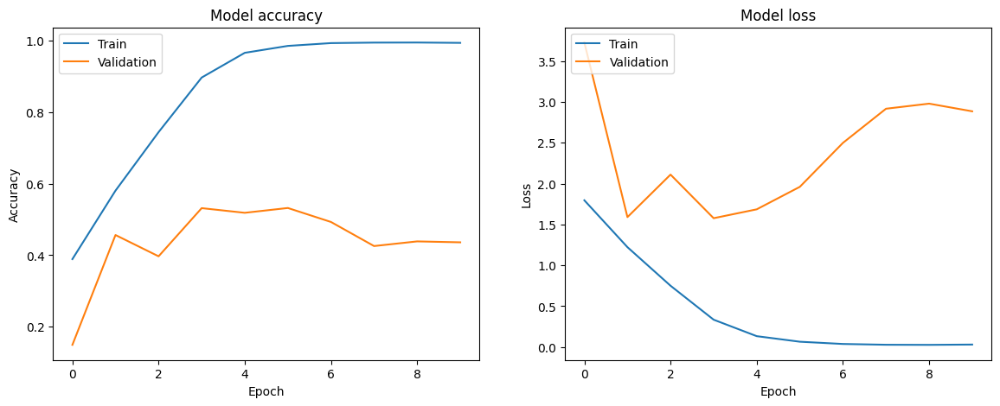

In [ ]:
# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

90/90 ━━━━━━━━━━━━━━━━━━━━ 5s 51ms/step


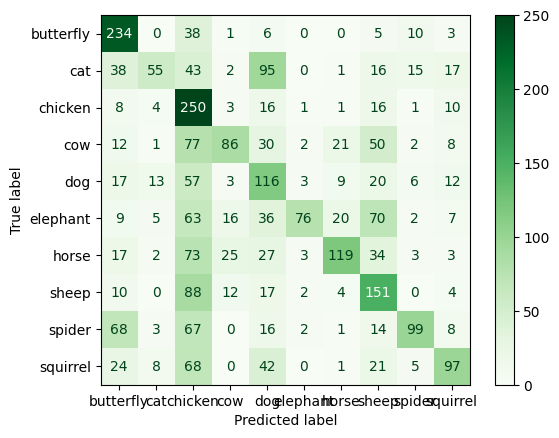

In [ ]:
# Show confusion Matrix
# Get the true labels and the predicted labels
y_true = test_images.classes
y_pred = model.predict(test_images)
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_images.class_indices.keys())
disp.plot(cmap=plt.cm.Greens)
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


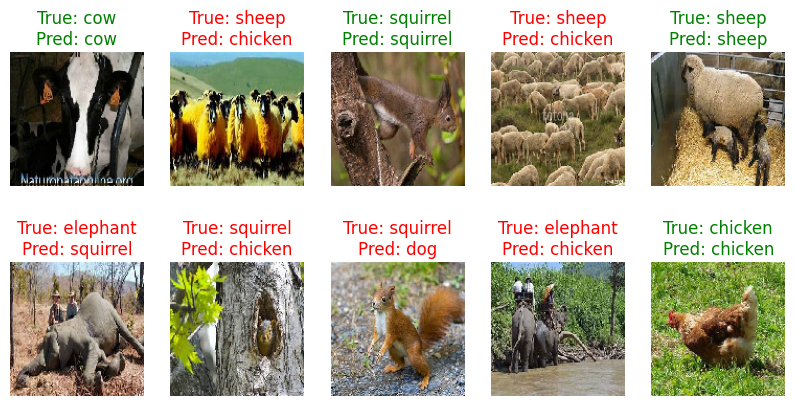

In [ ]:
# Plot images with true and predicted labels
def plot_images_with_labels(images, true_labels, predicted_labels, class_indices, num_images=10):
    plt.figure(figsize=(10, 5))
    for i in range(num_images):
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i])
        true_label = list(class_indices.keys())[list(class_indices.values()).index(np.argmax(true_labels[i]))]
        predicted_label = list(class_indices.keys())[list(class_indices.values()).index(predicted_labels[i])]
        color = 'green' if true_label == predicted_label else 'red'
        plt.title(f"True: {true_label}\nPred: {predicted_label}", color=color)
        plt.axis('off')
    plt.show()

# Get a batch of images and their true labels
batch_images, batch_labels = next(test_images)

# Get the predicted labels for the batch
batch_predictions = model.predict(batch_images)
batch_predicted_labels = np.argmax(batch_predictions, axis=1)

# Plot the images with their true and predicted labels
plot_images_with_labels(batch_images, batch_labels, batch_predicted_labels, test_images.class_indices)

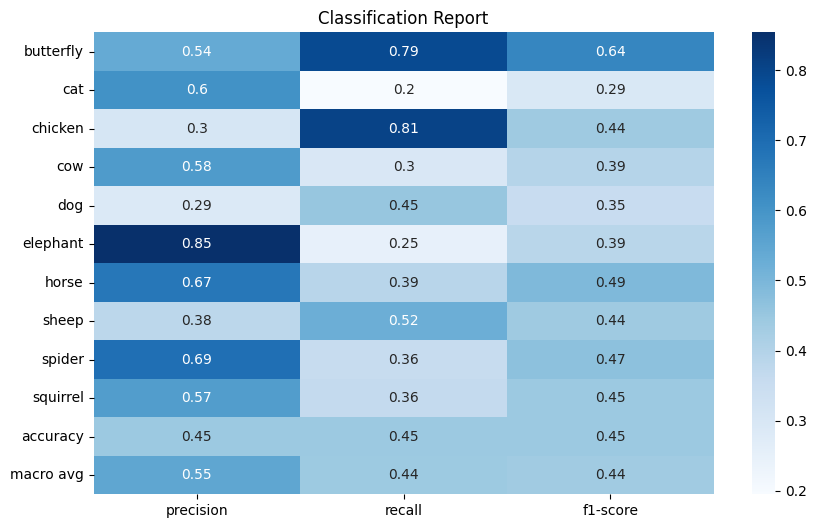

In [ ]:
# Classification report
# Generate the classification report
report = classification_report(y_true, y_pred_classes, target_names=list(test_images.class_indices.keys()), output_dict=True)

# Convert the report to a DataFrame
report_df = pd.DataFrame(report).transpose()

# Plot the classification report
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap='Blues')
plt.title('Classification Report')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


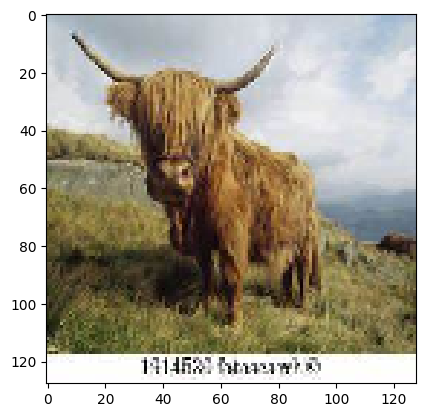

In [ ]:
# Feature map visualization
# Choose one image to test
img_num = 9

# Get a single image from the test set
batch_images, _ = next(test_images)  # Get a batch of images
img = batch_images[img_num % batch_size] # Select an image within the batch

# Display the selected image
plt.figure()
plt.imshow(img, interpolation='none')

model.layers[0].input

layer_outputs = [layer.output for layer in model.layers]
feature_map_model = Model(inputs=model.layers[0].input, outputs=layer_outputs)
img_expand = np.expand_dims(img, axis=0)

feature_maps = feature_map_model.predict(img_expand)
layer_names=[layer.name for layer in model.layers]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


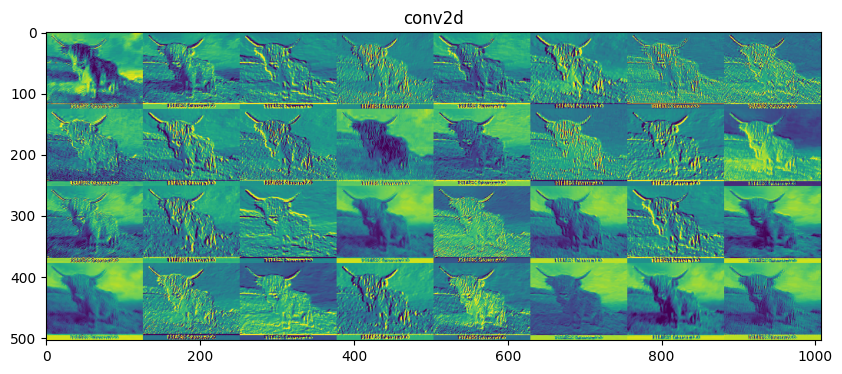

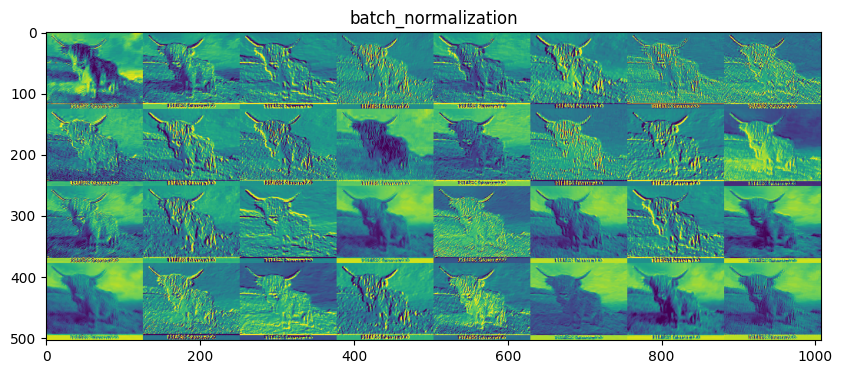

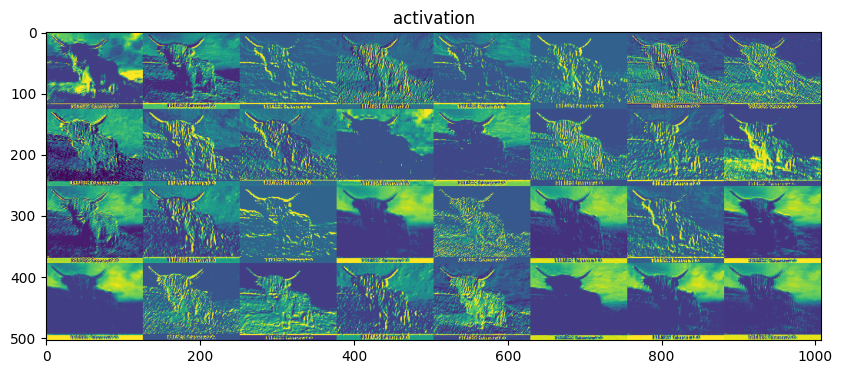

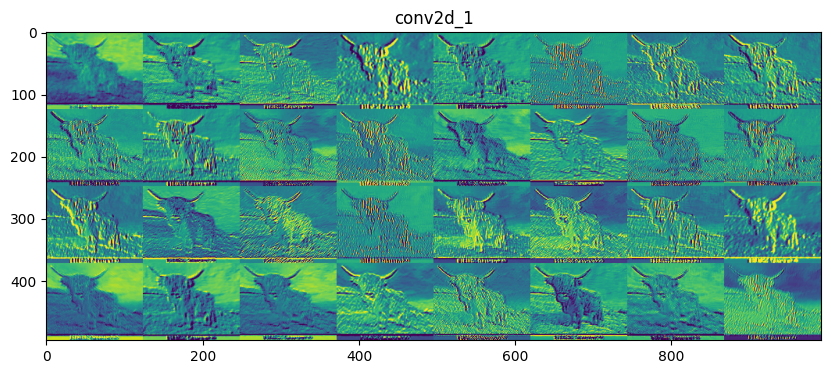

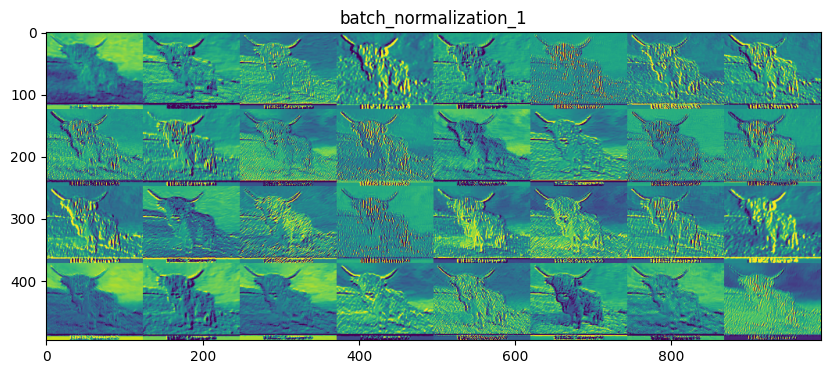

...

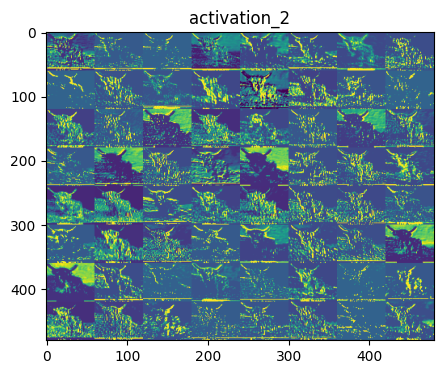

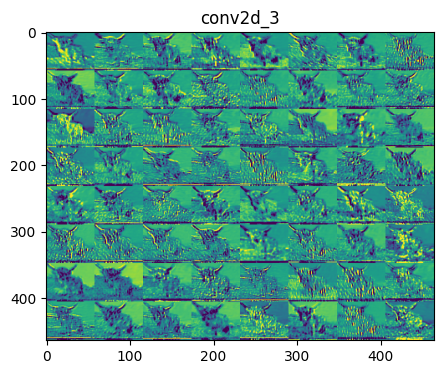

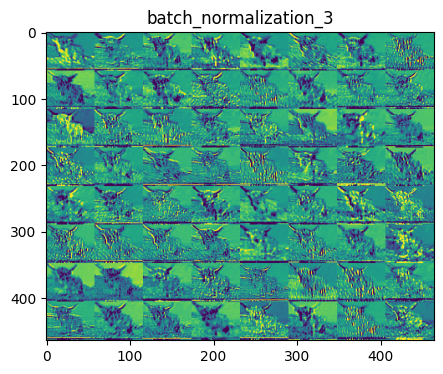

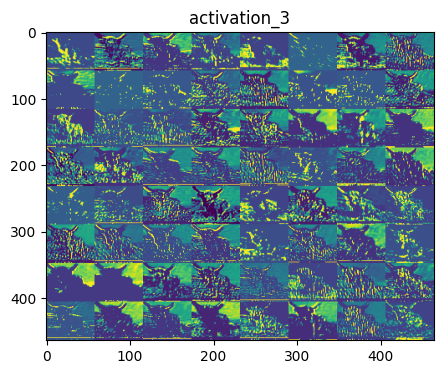

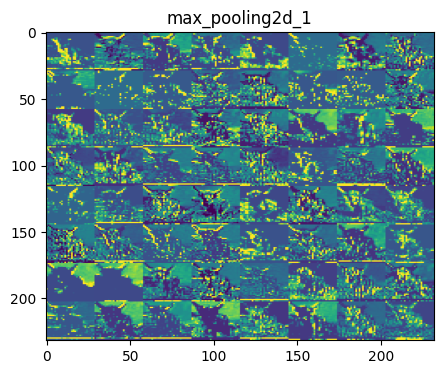

Skipping visualization for layer flatten as it is not a convolutional or pooling layer.
Skipping visualization for layer dense as it is not a convolutional or pooling layer.
Skipping visualization for layer batch_normalization_4 as it is not a convolutional or pooling layer.
Skipping visualization for layer activation_4 as it is not a convolutional or pooling layer.
Skipping visualization for layer dropout as it is not a convolutional or pooling layer.
Skipping visualization for layer dense_1 as it is not a convolutional or pooling layer.
Skipping visualization for layer activation_5 as it is not a convolutional or pooling layer.


In [ ]:
# Choose an image to visualize
img_tensor = np.expand_dims(img, axis=0)
amount_layers = 22

# Extract feature maps from different layers
# Only include convolutional and pooling layers for visualization
layer_outputs = [layer.output for layer in model.layers[:amount_layers]]  # Changed from [:6] to [:5]
activation_model = Model(inputs=model.layers[0].input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)

# Visualize feature maps
layer_names = [layer.name for layer in model.layers[:amount_layers]]  # Changed from [:6] to [:5]
for layer_name, layer_activation in zip(layer_names, activations):
    # Check if the layer is a convolutional or pooling layer
    if len(layer_activation.shape) == 4:  # Check if layer output is 4D
        n_features = layer_activation.shape[-1]
        size = layer_activation.shape[1]
        n_cols = 8
        display_grid = np.zeros((size * n_features // n_cols, size * n_cols))
        for col in range(n_features):
            x = col % n_cols
            y = col // n_cols
            channel_image = layer_activation[0, :, :, col]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[y * size : (y + 1) * size, x * size : (x + 1) * size] = channel_image
        scale = 20. / n_features
        plt.figure(figsize=(scale * n_cols*2, scale * n_features // n_cols*2))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.show()
    else:
        print(f"Skipping visualization for layer {layer_name} as it is not a convolutional or pooling layer.")

## 3.2 Our costum CNN model

In [ ]:
# Pre-processing steps
# Balance dataset
min_count = image_df['Label'].value_counts().min()
image_df_balanced = image_df.groupby('Label').apply(lambda x: x.sample(min_count, random_state=42)).reset_index(drop=True)

# Separate in train and test data
train_df, test_df = train_test_split(image_df_balanced, test_size=0.2, shuffle=True, random_state=42)

# Define image size and batch size
img_height, img_width = 128, 128
batch_size = 64

# Create an ImageDataGenerator for data augmentation
train_generator = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,  # Randomly rotate images
    width_shift_range=0.2,  # Randomly shift images horizontally
    height_shift_range=0.2,  # Randomly shift images vertically
    shear_range=0.2,  # Randomly shear images
    zoom_range=0.2,  # Randomly zoom into images
    horizontal_flip=True  # Flip images horizontally
)

test_generator = ImageDataGenerator(
    rescale=1./255
)

# Split the data into three categories
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(img_height, img_width),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True,
    subset='training'
)

validation_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(img_height, img_width),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=True,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=(img_height, img_width),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    shuffle=False
)

Found 9204 validated image filenames belonging to 10 classes.
Found 2300 validated image filenames belonging to 10 classes.
Found 2876 validated image filenames belonging to 10 classes.


<ipython-input-11-aa8c5701c6b2>:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  image_df_balanced = image_df.groupby('Label').apply(lambda x: x.sample(min_count, random_state=42)).reset_index(drop=True)


In [ ]:
# Define the CNN model
model = Sequential()

# Convolution Layer 1
model.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 2
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model.add(Conv2D(128, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())

# Fully Connected Layer 4
model.add(Dense(128))
model.add(Activation('relu'))

# Fully Connected Layer 5
model.add(Dropout(0.5))
model.add(Dense(len(translate)))
model.add(Activation('softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,930 (12.61 MB)

 Trainable params: 3,305,930 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Train the model
history = model.fit(
    train_images,
    validation_data=validation_images,
    epochs=20
)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


144/144 ━━━━━━━━━━━━━━━━━━━━ 73s 439ms/step - accuracy: 0.1442 - loss: 2.2998 - val_accuracy: 0.2352 - val_loss: 2.1010
Epoch 2/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 71s 405ms/step - accuracy: 0.2339 - loss: 2.0962 - val_accuracy: 0.2935 - val_loss: 1.9407
Epoch 3/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 399ms/step - accuracy: 0.2812 - loss: 1.9812 - val_accuracy: 0.3543 - val_loss: 1.8335
Epoch 4/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 90s 457ms/step - accuracy: 0.3338 - loss: 1.8741 - val_accuracy: 0.3674 - val_loss: 1.7939
Epoch 5/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 84s 472ms/step - accuracy: 0.3491 - loss: 1.8260 - val_accuracy: 0.3909 - val_loss: 1.7117
Epoch 6/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 80s 455ms/step - accuracy: 0.3698 - loss: 1.7664 - val_accuracy: 0.4187 - val_loss: 1.6670
Epoch 7/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 74s 400ms/step - accuracy: 0.3902 - loss: 1.7086 - val_accuracy: 0.4422 - val_loss: 1.6346
Epoch 8/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 67s 456ms/step - accuracy: 0.4049 - loss: 1.6755 - val

In [ ]:
# Evaluate the model on the test data
evaluation = model.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

45/45 ━━━━━━━━━━━━━━━━━━━━ 6s 122ms/step - accuracy: 0.5442 - loss: 1.3593
Test Loss: 1.3436487913131714
Test Accuracy: 0.5542420148849487


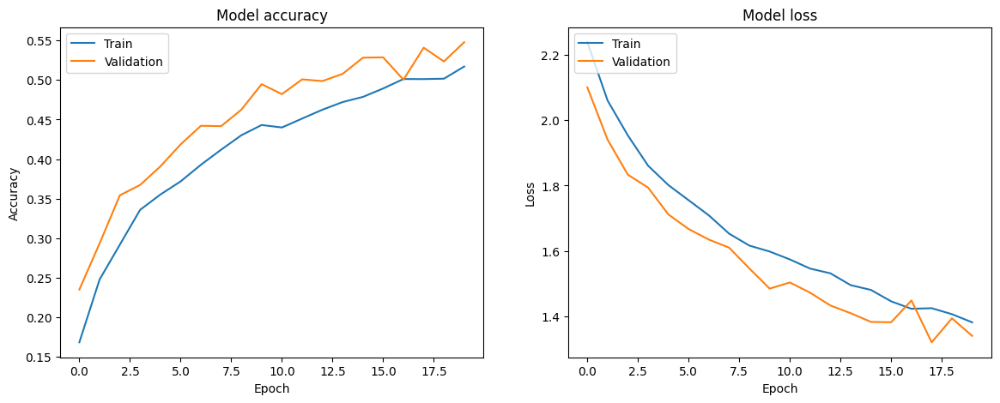

In [ ]:
# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

45/45 ━━━━━━━━━━━━━━━━━━━━ 5s 109ms/step


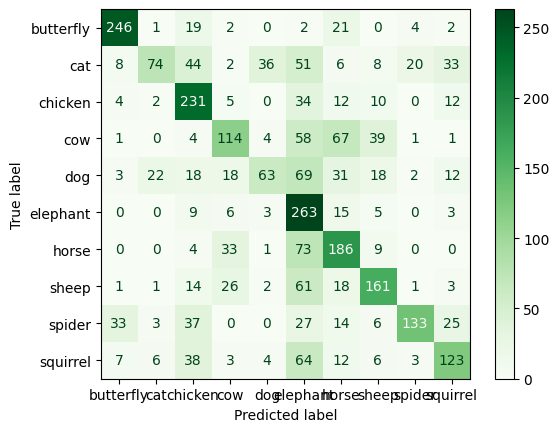

In [ ]:
# Show confusion Matrix
# Get the true labels and the predicted labels
y_true = test_images.classes
y_pred = model.predict(test_images)
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_images.class_indices.keys())
disp.plot(cmap=plt.cm.Greens)
plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step 


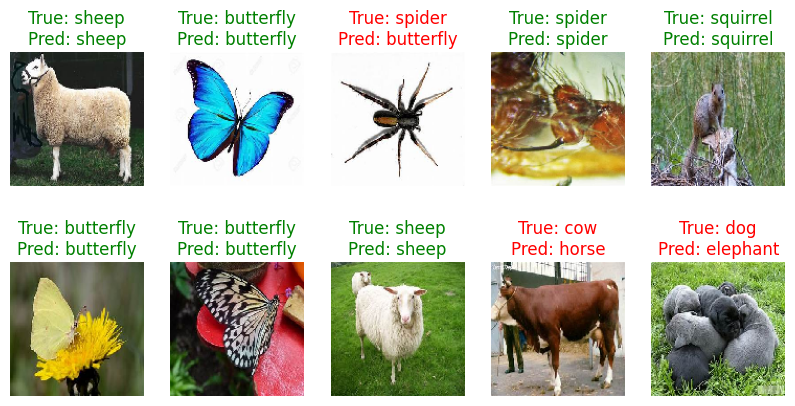

In [ ]:
# Plot images with true and predicted labels
def plot_images_with_labels(images, true_labels, predicted_labels, class_indices, num_images=10):
    plt.figure(figsize=(10, 5))
    for i in range(num_images):
        plt.subplot(2, 5, i + 1)
        plt.imshow(images[i])
        true_label = list(class_indices.keys())[list(class_indices.values()).index(np.argmax(true_labels[i]))]
        predicted_label = list(class_indices.keys())[list(class_indices.values()).index(predicted_labels[i])]
        color = 'green' if true_label == predicted_label else 'red'
        plt.title(f"True: {true_label}\nPred: {predicted_label}", color=color)
        plt.axis('off')
    plt.show()

# Get a batch of images and their true labels
batch_images, batch_labels = next(test_images)

# Get the predicted labels for the batch
batch_predictions = model.predict(batch_images)
batch_predicted_labels = np.argmax(batch_predictions, axis=1)

# Plot the images with their true and predicted labels
plot_images_with_labels(batch_images, batch_labels, batch_predicted_labels, test_images.class_indices)

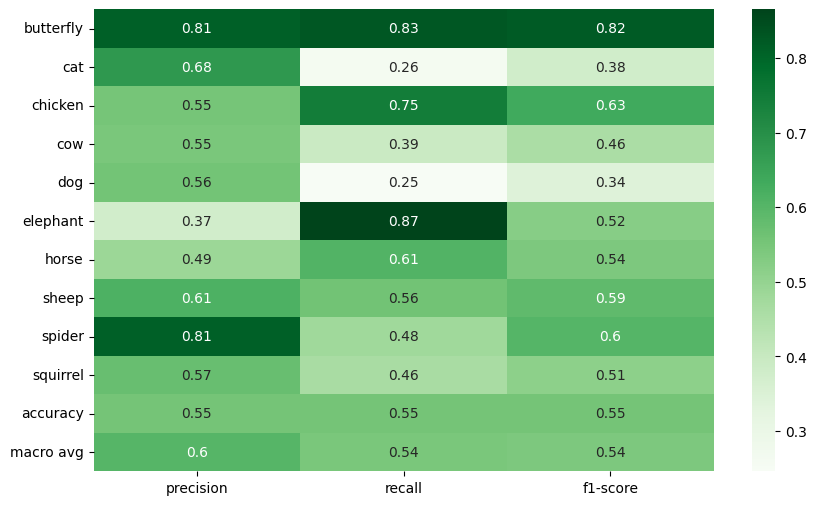

In [ ]:
# Classification report
# Generate the classification report
report = classification_report(y_true, y_pred_classes, target_names=list(test_images.class_indices.keys()), output_dict=True)

# Convert the report to a DataFrame
report_df = pd.DataFrame(report).transpose()

# Plot the classification report
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap='Greens')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step


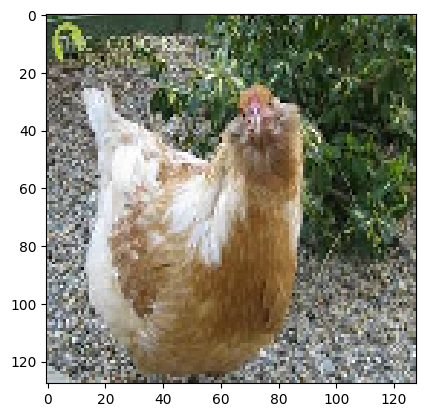

In [ ]:
# Feature map visualization
# Choose one image to test
img_num = 9

# Get a single image from the test set
batch_images, _ = next(test_images)  # Get a batch of images
img = batch_images[img_num % batch_size] # Select an image within the batch

# Display the selected image
plt.figure()
plt.imshow(img, interpolation='none')

model.layers[0].input

layer_outputs = [layer.output for layer in model.layers]
feature_map_model = Model(inputs=model.layers[0].input, outputs=layer_outputs)
img_expand = np.expand_dims(img, axis=0)

feature_maps = feature_map_model.predict(img_expand)
layer_names=[layer.name for layer in model.layers]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


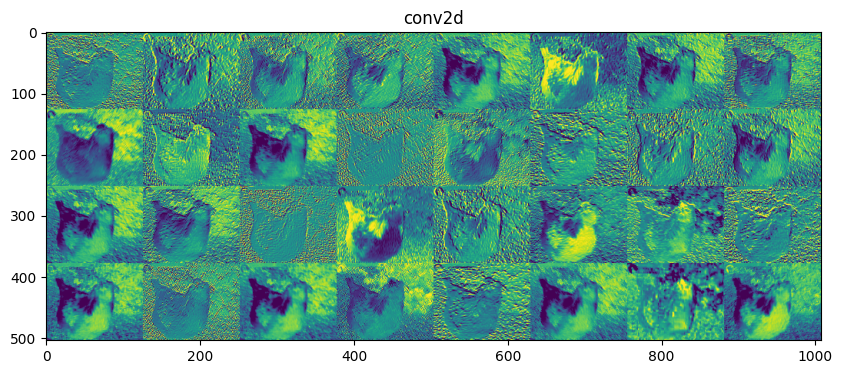

<ipython-input-25-43d7ff658024>:25: RuntimeWarning: invalid value encountered in divide
  channel_image /= channel_image.std()
<ipython-input-25-43d7ff658024>:28: RuntimeWarning: invalid value encountered in cast
  channel_image = np.clip(channel_image, 0, 255).astype('uint8')


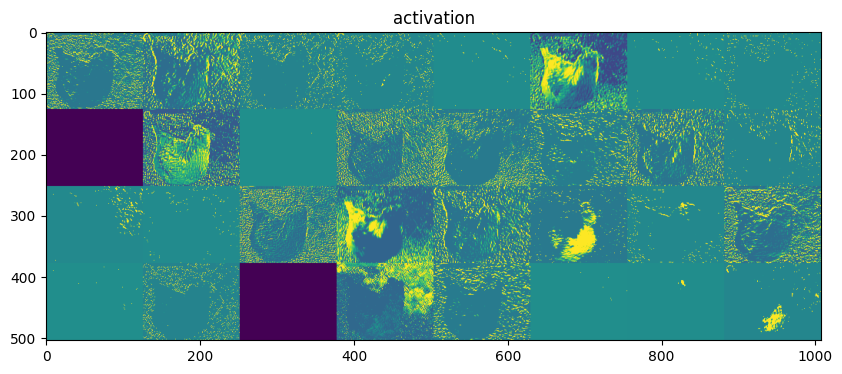

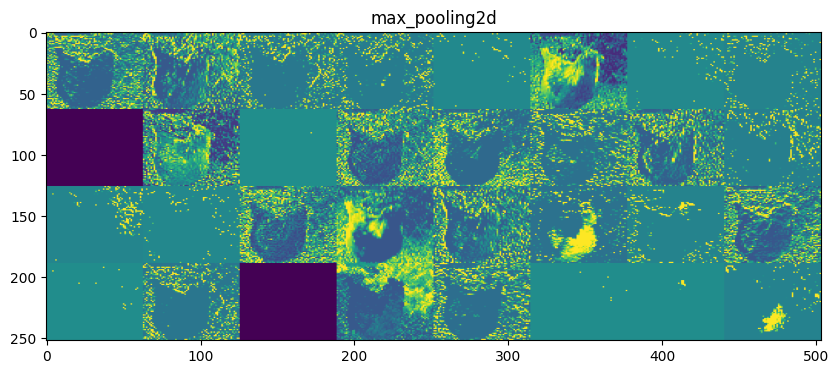

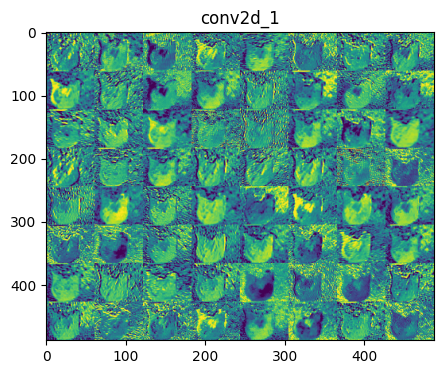

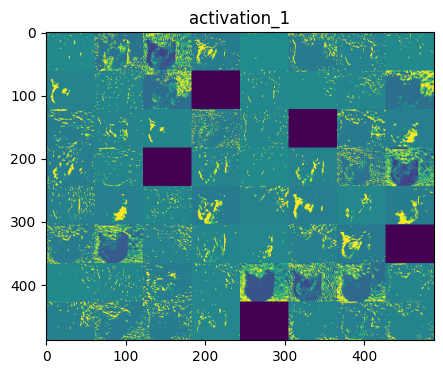

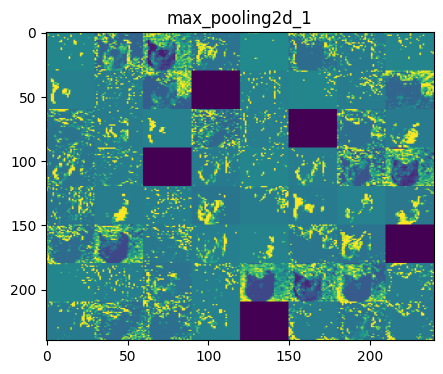

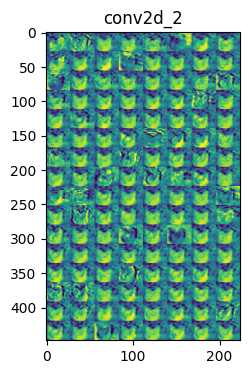

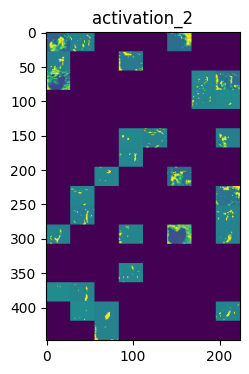

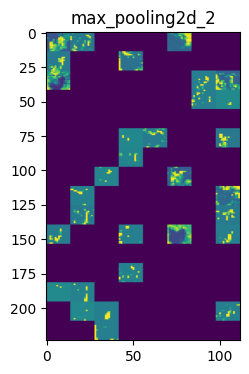

Skipping visualization for layer flatten as it is not a convolutional or pooling layer.
Skipping visualization for layer dense as it is not a convolutional or pooling layer.
Skipping visualization for layer activation_3 as it is not a convolutional or pooling layer.
Skipping visualization for layer dropout as it is not a convolutional or pooling layer.
Skipping visualization for layer dense_1 as it is not a convolutional or pooling layer.
Skipping visualization for layer activation_4 as it is not a convolutional or pooling layer.


In [ ]:
# Choose an image to visualize
img_tensor = np.expand_dims(img, axis=0)
amount_layers = 15

# Extract feature maps from different layers
# Only include convolutional and pooling layers for visualization
layer_outputs = [layer.output for layer in model.layers[:amount_layers]]  # Changed from [:6] to [:5]
activation_model = Model(inputs=model.layers[0].input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)

# Visualize feature maps
layer_names = [layer.name for layer in model.layers[:amount_layers]]  # Changed from [:6] to [:5]
for layer_name, layer_activation in zip(layer_names, activations):
    # Check if the layer is a convolutional or pooling layer
    if len(layer_activation.shape) == 4:  # Check if layer output is 4D
        n_features = layer_activation.shape[-1]
        size = layer_activation.shape[1]
        n_cols = 8
        display_grid = np.zeros((size * n_features // n_cols, size * n_cols))
        for col in range(n_features):
            x = col % n_cols
            y = col // n_cols
            channel_image = layer_activation[0, :, :, col]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[y * size : (y + 1) * size, x * size : (x + 1) * size] = channel_image
        scale = 20. / n_features
        plt.figure(figsize=(scale * n_cols*2, scale * n_features // n_cols*2))
        plt.title(layer_name)
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.show()
    else:
        print(f"Skipping visualization for layer {layer_name} as it is not a convolutional or pooling layer.")

## 3.3 Adapt parameters

#### a) Adapt parameters: Convolutional layers

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_5 (Activation)            │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_6 (Activation)            │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 57600)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       7,372,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_8 (Activation)            │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 7,393,610 (28.20 MB)

 Trainable params: 7,393,610 (28.20 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 65s 419ms/step - accuracy: 0.1535 - loss: 2.3860 - val_accuracy: 0.2865 - val_loss: 2.0149
Epoch 2/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 78s 404ms/step - accuracy: 0.2589 - loss: 2.0314 - val_accuracy: 0.3043 - val_loss: 1.9257
Epoch 3/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 57s 382ms/step - accuracy: 0.3077 - loss: 1.9211 - val_accuracy: 0.3613 - val_loss: 1.8266
Epoch 4/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 391ms/step - accuracy: 0.3418 - loss: 1.8666 - val_accuracy: 0.3796 - val_loss: 1.7606
Epoch 5/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 57s 383ms/step - accuracy: 0.3460 - loss: 1.8153 - val_accuracy: 0.3870 - val_loss: 1.7173
Epoch 6/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 83s 390ms/step - accuracy: 0.3667 - loss: 1.7882 - val_accuracy: 0.3796 - val_loss: 1.7302
Epoch 7/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 57s 385ms/step - accuracy: 0.3816 - loss: 1.7528 - val_accuracy: 0.4078 - val_loss: 1.6805
Epoch 8/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 390ms/step - accuracy: 0.3769 - loss: 1

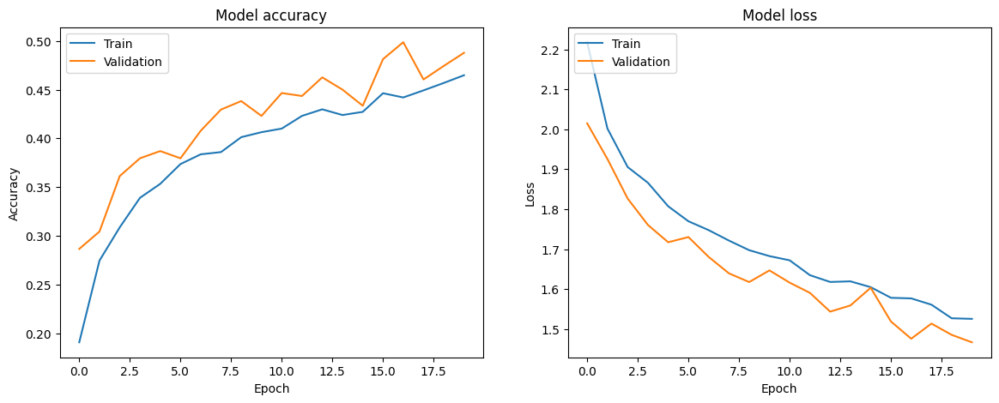

In [ ]:
# 2 Convolutional layers
# Define the CNN model
model_2CNN = Sequential()

# Convolution Layer 1
model_2CNN.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model_2CNN.add(Activation('relu'))
model_2CNN.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 2
model_2CNN.add(Conv2D(64, (3, 3)))
model_2CNN.add(Activation('relu'))
model_2CNN.add(MaxPooling2D(pool_size=(2, 2)))
model_2CNN.add(Flatten())

# Fully Connected Layer 3
model_2CNN.add(Dense(128))
model_2CNN.add(Activation('relu'))

# Fully Connected Layer 4
model_2CNN.add(Dropout(0.5))
model_2CNN.add(Dense(len(translate)))
model_2CNN.add(Activation('softmax'))

# Compile the model
model_2CNN.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_2CNN.summary()

# Train the model
history = model_2CNN.fit(
    train_images,
    validation_data=validation_images,
    epochs=20
)

# Evaluate the model on the test data
evaluation = model_2CNN.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_9 (Activation)            │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_10 (Activation)           │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 28, 28, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_11 (Activation)           │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 14, 14, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 12, 12, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_12 (Activation)           │ (None, 12, 12, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 6, 6, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 4608)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │         589,952 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_13 (Activation)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_14 (Activation)           │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 721,418 (2.75 MB)

 Trainable params: 721,418 (2.75 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 65s 409ms/step - accuracy: 0.1175 - loss: 2.2940 - val_accuracy: 0.1800 - val_loss: 2.1917
Epoch 2/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 395ms/step - accuracy: 0.1813 - loss: 2.1958 - val_accuracy: 0.2348 - val_loss: 2.0749
Epoch 3/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 396ms/step - accuracy: 0.2388 - loss: 2.0716 - val_accuracy: 0.3017 - val_loss: 1.9182
Epoch 4/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 82s 393ms/step - accuracy: 0.2678 - loss: 1.9779 - val_accuracy: 0.3413 - val_loss: 1.8341
Epoch 5/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 67s 451ms/step - accuracy: 0.3221 - loss: 1.8868 - val_accuracy: 0.3600 - val_loss: 1.7770
Epoch 6/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 392ms/step - accuracy: 0.3455 - loss: 1.8243 - val_accuracy: 0.3800 - val_loss: 1.7556
Epoch 7/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 386ms/step - accuracy: 0.3725 - loss: 1.7487 - val_accuracy: 0.4296 - val_loss: 1.6517
Epoch 8/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 81s 388ms/step - accuracy: 0.4020 - loss: 1

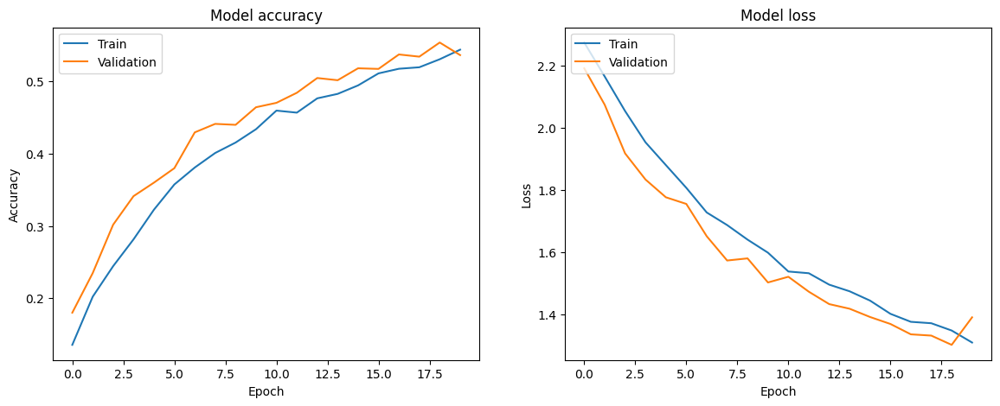

In [ ]:
# 4 Convolutional layers
# Define the CNN model
model_4CNN = Sequential()

# Convolution Layer 1
model_4CNN.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model_4CNN.add(Activation('relu'))
model_4CNN.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 2
model_4CNN.add(Conv2D(64, (3, 3)))
model_4CNN.add(Activation('relu'))
model_4CNN.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model_4CNN.add(Conv2D(64, (3, 3)))
model_4CNN.add(Activation('relu'))
model_4CNN.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 4
model_4CNN.add(Conv2D(128, (3, 3)))
model_4CNN.add(Activation('relu'))
model_4CNN.add(MaxPooling2D(pool_size=(2, 2)))
model_4CNN.add(Flatten())

# Fully Connected Layer 5
model_4CNN.add(Dense(128))
model_4CNN.add(Activation('relu'))

# Fully Connected Layer 6
model_4CNN.add(Dropout(0.5))
model_4CNN.add(Dense(len(translate)))
model_4CNN.add(Activation('softmax'))

# Compile the model
model_4CNN.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_4CNN.summary()

# Train the model
history = model_4CNN.fit(
    train_images,
    validation_data=validation_images,
    epochs=20
)

# Evaluate the model on the test data
evaluation = model_4CNN.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

#### b) Adapt parameters: Pooling layers

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 9,917,792 (37.83 MB)

 Trainable params: 3,305,930 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 6,611,862 (25.22 MB)

Epoch 1/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 99s 568ms/step - accuracy: 0.1075 - loss: 4.0280 - val_accuracy: 0.1370 - val_loss: 2.2884
Epoch 2/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 67s 451ms/step - accuracy: 0.1152 - loss: 2.2963 - val_accuracy: 0.1413 - val_loss: 2.2822
Epoch 3/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 81s 443ms/step - accuracy: 0.1261 - loss: 2.2832 - val_accuracy: 0.1674 - val_loss: 2.2511
Epoch 4/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 74s 503ms/step - accuracy: 0.1523 - loss: 2.2545 - val_accuracy: 0.1748 - val_loss: 2.2218
Epoch 5/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 74s 437ms/step - accuracy: 0.1621 - loss: 2.2317 - val_accuracy: 0.1809 - val_loss: 2.2352
Epoch 6/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 65s 430ms/step - accuracy: 0.1849 - loss: 2.1989 - val_accuracy: 0.1952 - val_loss: 2.1666
Epoch 7/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 83s 441ms/step - accuracy: 0.1867 - loss: 2.1575 - val_accuracy: 0.2096 - val_loss: 2.1379
Epoch 8/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 83s 443ms/step - accuracy: 0.1997 - loss: 2

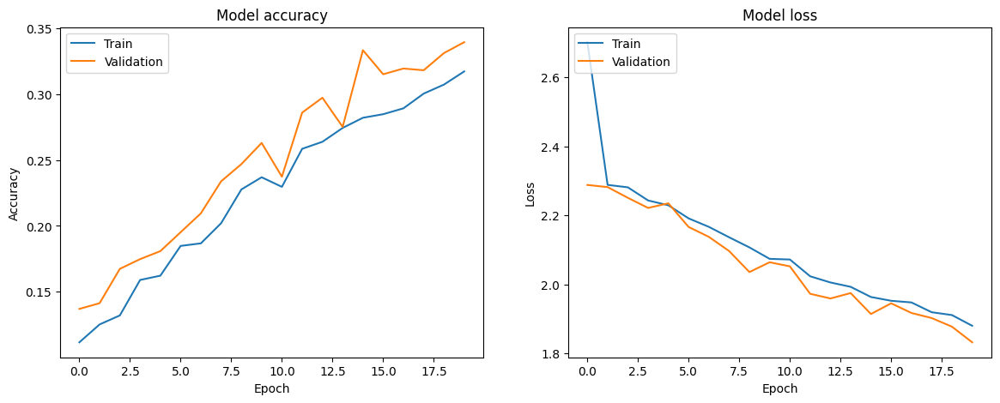

In [ ]:
# 1 Pooling Layer
# Define the CNN model
model_1PL = Sequential()

# Convolution Layer 1
model_1PL.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model_1PL.add(Activation('relu'))

# Convolution Layer 2
model_1PL.add(Conv2D(64, (3, 3)))
model_1PL.add(Activation('relu'))

# Convolution Layer 3
model_1PL.add(Conv2D(128, (3, 3)))
model_1PL.add(Activation('relu'))
model_1PL.add(MaxPooling2D(pool_size=(2, 2)))
model_1PL.add(Flatten())

# Fully Connected Layer 4
model_1PL.add(Dense(128))
model_1PL.add(Activation('relu'))

# Fully Connected Layer 5
model_1PL.add(Dropout(0.5))
model_1PL.add(Dense(len(translate)))
model_1PL.add(Activation('softmax'))

# Compile the model
model_1PL.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Train the model
history = model_1PL.fit(
    train_images,
    validation_data=validation_images,
    epochs=20
)

# Evaluate the model on the test data
evaluation = model_1PL.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_20 (Activation)           │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_13 (Conv2D)                   │ (None, 124, 124, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_21 (Activation)           │ (None, 124, 124, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 62, 62, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_14 (Conv2D)                   │ (None, 60, 60, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_22 (Activation)           │ (None, 60, 60, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 30, 30, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_4 (Flatten)                  │ (None, 115200)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 128)                 │      14,745,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_23 (Activation)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_24 (Activation)           │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,840,266 (56.61 MB)

 Trainable params: 14,840,266 (56.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 80s 498ms/step - accuracy: 0.1130 - loss: 2.4401 - val_accuracy: 0.1891 - val_loss: 2.1926
Epoch 2/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 62s 414ms/step - accuracy: 0.1912 - loss: 2.1948 - val_accuracy: 0.2165 - val_loss: 2.1075
Epoch 3/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 62s 415ms/step - accuracy: 0.2545 - loss: 2.0448 - val_accuracy: 0.3022 - val_loss: 1.9341
Epoch 4/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 82s 417ms/step - accuracy: 0.2884 - loss: 1.9345 - val_accuracy: 0.3543 - val_loss: 1.7920
Epoch 5/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 81s 408ms/step - accuracy: 0.3269 - loss: 1.8638 - val_accuracy: 0.3448 - val_loss: 1.8096
Epoch 6/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 61s 408ms/step - accuracy: 0.3571 - loss: 1.7992 - val_accuracy: 0.3657 - val_loss: 1.7196
Epoch 7/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 71s 479ms/step - accuracy: 0.3699 - loss: 1.7449 - val_accuracy: 0.3822 - val_loss: 1.7124
Epoch 8/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 71s 404ms/step - accuracy: 0.3877 - loss: 1

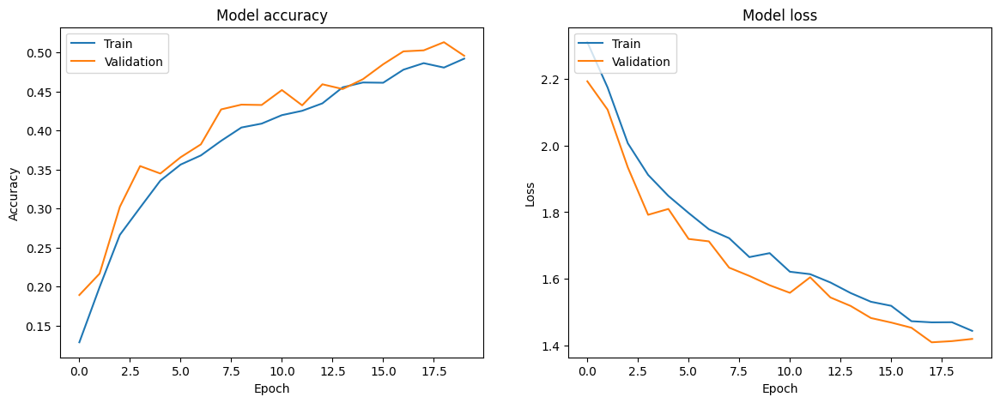

In [ ]:
# 2 Pooling Layers
# Define the CNN model
model_2PL = Sequential()

# Convolution Layer 1
model_2PL.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model_2PL.add(Activation('relu'))

# Convolution Layer 2
model_2PL.add(Conv2D(64, (3, 3)))
model_2PL.add(Activation('relu'))
model_2PL.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model_2PL.add(Conv2D(128, (3, 3)))
model_2PL.add(Activation('relu'))
model_2PL.add(MaxPooling2D(pool_size=(2, 2)))
model_2PL.add(Flatten())

# Fully Connected Layer 4
model_2PL.add(Dense(128))
model_2PL.add(Activation('relu'))

# Fully Connected Layer 5
model_2PL.add(Dropout(0.5))
model_2PL.add(Dense(len(translate)))
model_2PL.add(Activation('softmax'))

# Compile the model
model_2PL.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_2PL.summary()

# Train the model
history = model_2PL.fit(
    train_images,
    validation_data=validation_images,
    epochs=20
)

# Evaluate the model on the test data
evaluation = model_2PL.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

#### c) Adapt parameters: Dropout layer

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_25 (Activation)           │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_16 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_26 (Activation)           │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_17 (Conv2D)                   │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_27 (Activation)           │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_28 (Activation)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_29 (Activation)           │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,930 (12.61 MB)

 Trainable params: 3,305,930 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 64s 405ms/step - accuracy: 0.1327 - loss: 2.3401 - val_accuracy: 0.2061 - val_loss: 2.1183
Epoch 2/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 134s 783ms/step - accuracy: 0.2878 - loss: 1.9743 - val_accuracy: 0.3252 - val_loss: 1.8251
Epoch 3/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 86s 393ms/step - accuracy: 0.3705 - loss: 1.7709 - val_accuracy: 0.3883 - val_loss: 1.7249
Epoch 4/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 390ms/step - accuracy: 0.4026 - loss: 1.6723 - val_accuracy: 0.3983 - val_loss: 1.7252
Epoch 5/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 69s 469ms/step - accuracy: 0.4282 - loss: 1.6072 - val_accuracy: 0.4200 - val_loss: 1.6547
Epoch 6/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 71s 386ms/step - accuracy: 0.4652 - loss: 1.5397 - val_accuracy: 0.4343 - val_loss: 1.5641
Epoch 7/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 387ms/step - accuracy: 0.4809 - loss: 1.4923 - val_accuracy: 0.4722 - val_loss: 1.4967
Epoch 8/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 92s 452ms/step - accuracy: 0.4891 - loss: 

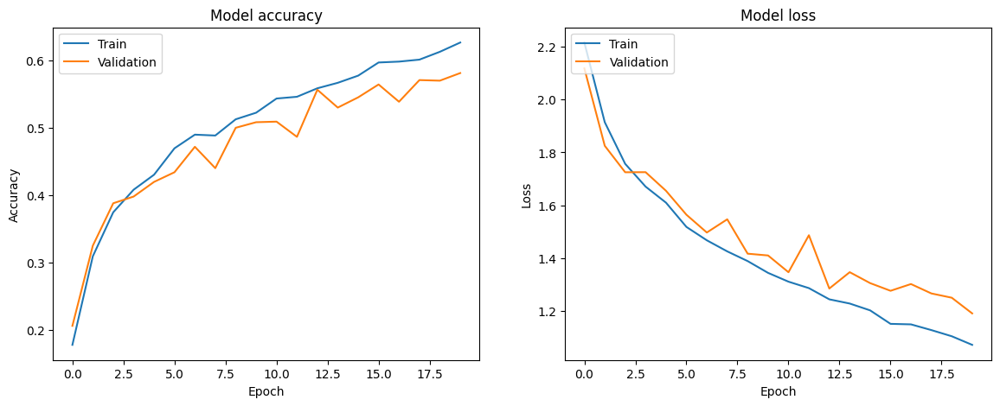

In [ ]:
# No Dropout
# Define the CNN model
model_0D = Sequential()

# Convolution Layer 1
model_0D.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model_0D.add(Activation('relu'))
model_0D.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 2
model_0D.add(Conv2D(64, (3, 3)))
model_0D.add(Activation('relu'))
model_0D.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model_0D.add(Conv2D(128, (3, 3)))
model_0D.add(Activation('relu'))
model_0D.add(MaxPooling2D(pool_size=(2, 2)))
model_0D.add(Flatten())

# Fully Connected Layer 4
model_0D.add(Dense(128))
model_0D.add(Activation('relu'))

# Fully Connected Layer 5
model_0D.add(Dense(len(translate)))
model_0D.add(Activation('softmax'))

# Compile the model
model_0D.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_0D.summary()

# Train the model
history = model_0D.fit(
    train_images,
    validation_data=validation_images,
    epochs=20
)

# Evaluate the model on the test data
evaluation = model_0D.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)                   │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_35 (Activation)           │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_18 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_22 (Conv2D)                   │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_36 (Activation)           │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_19 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_23 (Conv2D)                   │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_37 (Activation)           │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_20 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_7 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_38 (Activation)           │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_39 (Activation)           │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,930 (12.61 MB)

 Trainable params: 3,305,930 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 64s 399ms/step - accuracy: 0.1297 - loss: 2.2846 - val_accuracy: 0.2391 - val_loss: 2.1064
Epoch 2/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 79s 400ms/step - accuracy: 0.2238 - loss: 2.1035 - val_accuracy: 0.2761 - val_loss: 1.9631
Epoch 3/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 81s 393ms/step - accuracy: 0.2680 - loss: 2.0165 - val_accuracy: 0.2935 - val_loss: 1.9533
Epoch 4/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 57s 385ms/step - accuracy: 0.2983 - loss: 1.9136 - val_accuracy: 0.3557 - val_loss: 1.8029
Epoch 5/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 393ms/step - accuracy: 0.3251 - loss: 1.8719 - val_accuracy: 0.3930 - val_loss: 1.7102
Epoch 6/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 81s 386ms/step - accuracy: 0.3481 - loss: 1.8162 - val_accuracy: 0.4083 - val_loss: 1.6988
Epoch 7/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 85s 414ms/step - accuracy: 0.3725 - loss: 1.7678 - val_accuracy: 0.3965 - val_loss: 1.6869
Epoch 8/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 78s 383ms/step - accuracy: 0.3774 - loss: 1

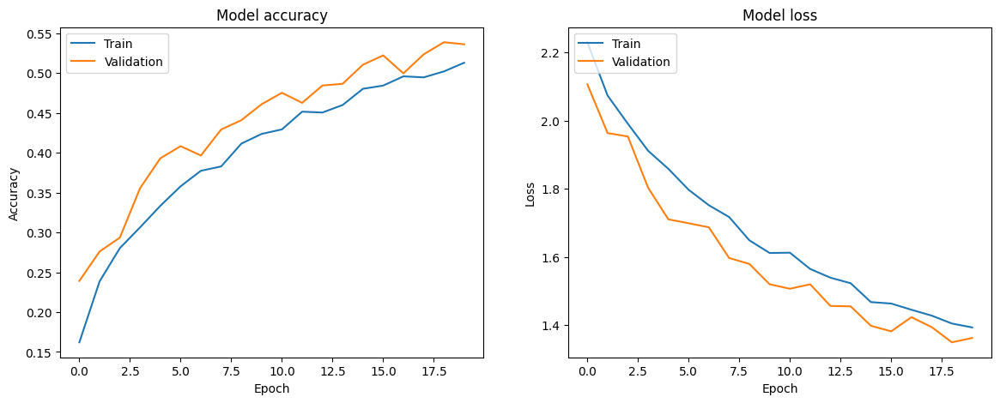

In [ ]:
# Dropout 20%
# Define the CNN model
model_20D = Sequential()

# Convolution Layer 1
model_20D.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model_20D.add(Activation('relu'))
model_20D.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 2
model_20D.add(Conv2D(64, (3, 3)))
model_20D.add(Activation('relu'))
model_20D.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model_20D.add(Conv2D(128, (3, 3)))
model_20D.add(Activation('relu'))
model_20D.add(MaxPooling2D(pool_size=(2, 2)))
model_20D.add(Flatten())

# Fully Connected Layer 4
model_20D.add(Dense(128))
model_20D.add(Activation('relu'))

# Fully Connected Layer 5
model_20D.add(Dropout(0.5))
model_20D.add(Dense(len(translate)))
model_20D.add(Activation('softmax'))

# Compile the model
model_20D.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_20D.summary()

# Train the model
history = model_20D.fit(
    train_images,
    validation_data=validation_images,
    epochs=20
)

# Evaluate the model on the test data
evaluation = model_20D.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

#### d) Adapt parameters: Batch Normalization layers

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 28, 28, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴──────────────

 Total params: 3,307,338 (12.62 MB)

 Trainable params: 3,306,634 (12.61 MB)

 Non-trainable params: 704 (2.75 KB)

Epoch 1/20


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


144/144 ━━━━━━━━━━━━━━━━━━━━ 82s 490ms/step - accuracy: 0.2259 - loss: 2.3837 - val_accuracy: 0.1039 - val_loss: 2.9605
Epoch 2/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 63s 402ms/step - accuracy: 0.3537 - loss: 1.8819 - val_accuracy: 0.2043 - val_loss: 2.5468
Epoch 3/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 90s 465ms/step - accuracy: 0.3941 - loss: 1.7211 - val_accuracy: 0.2352 - val_loss: 2.2827
Epoch 4/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 74s 409ms/step - accuracy: 0.4260 - loss: 1.6389 - val_accuracy: 0.3678 - val_loss: 1.7613
Epoch 5/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 391ms/step - accuracy: 0.4462 - loss: 1.5660 - val_accuracy: 0.4339 - val_loss: 1.6201
Epoch 6/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 83s 389ms/step - accuracy: 0.4712 - loss: 1.5301 - val_accuracy: 0.4248 - val_loss: 1.6469
Epoch 7/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 91s 456ms/step - accuracy: 0.4886 - loss: 1.4667 - val_accuracy: 0.3817 - val_loss: 1.7090
Epoch 8/20
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 394ms/step - accuracy: 0.5141 - loss: 1.3893 - val

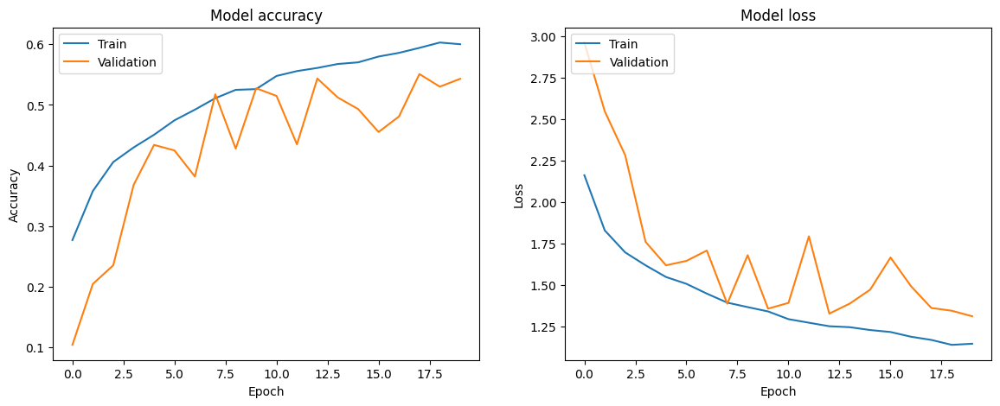

In [ ]:
# With batch normalization
# Define the CNN model
model_BN = Sequential()

# Convolution Layer 1
model_BN.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model_BN.add(BatchNormalization(axis=-1))
model_BN.add(Activation('relu'))
model_BN.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 2
model_BN.add(Conv2D(64, (3, 3)))
model_BN.add(BatchNormalization(axis=-1))
model_BN.add(Activation('relu'))
model_BN.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model_BN.add(Conv2D(128, (3, 3)))
model_BN.add(BatchNormalization(axis=-1))
model_BN.add(Activation('relu'))
model_BN.add(MaxPooling2D(pool_size=(2, 2)))
model_BN.add(Flatten())

# Fully Connected Layer 4
model_BN.add(Dense(128))
model_BN.add(BatchNormalization())
model_BN.add(Activation('relu'))

# Fully Connected Layer 5
model_BN.add(Dropout(0.5))
model_BN.add(Dense(len(translate)))
model_BN.add(Activation('softmax'))

# Compile the model
model_BN.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_BN.summary()

# Train the model
history = model_BN.fit(
    train_images,
    validation_data=validation_images,
    epochs=20
)

# Evaluate the model on the test data
evaluation = model_BN.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

#### e) Adapt parameters: Number of epochs

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_5 (Activation)            │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_6 (Activation)            │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 28, 28, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_8 (Activation)            │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           1,290 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_9 (Activation)            │ (None, 10)                  │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,930 (12.61 MB)

 Trainable params: 3,305,930 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 72s 461ms/step - accuracy: 0.1420 - loss: 2.3085 - val_accuracy: 0.2517 - val_loss: 2.0855
Epoch 2/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 72s 405ms/step - accuracy: 0.2244 - loss: 2.0851 - val_accuracy: 0.2722 - val_loss: 2.0029
Epoch 3/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 389ms/step - accuracy: 0.2747 - loss: 1.9785 - val_accuracy: 0.3396 - val_loss: 1.8848
Epoch 4/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 395ms/step - accuracy: 0.3022 - loss: 1.9295 - val_accuracy: 0.3357 - val_loss: 1.8903
Epoch 5/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 81s 391ms/step - accuracy: 0.3237 - loss: 1.8679 - val_accuracy: 0.3904 - val_loss: 1.7674
Epoch 6/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 390ms/step - accuracy: 0.3571 - loss: 1.7991 - val_accuracy: 0.3848 - val_loss: 1.7270
Epoch 7/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 392ms/step - accuracy: 0.3753 - loss: 1.7569 - val_accuracy: 0.4109 - val_loss: 1.6756
Epoch 8/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 92s 461ms/step - accuracy: 0.3985 - loss: 1

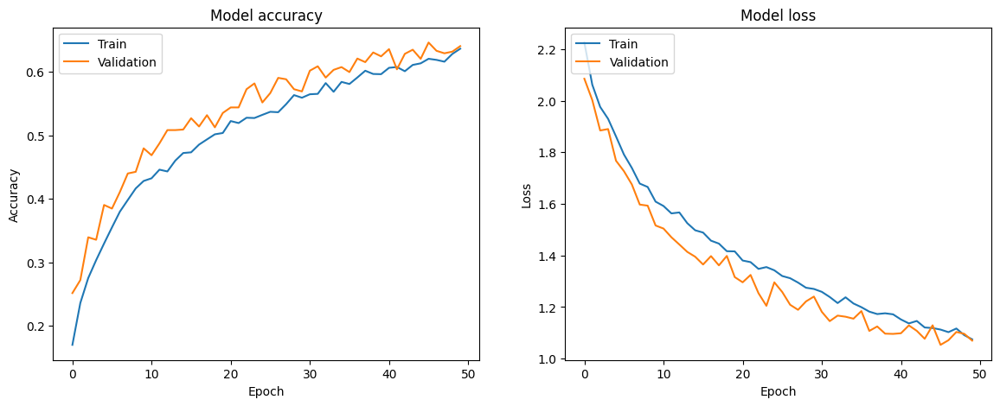

In [ ]:
# 50 Epochs
# Define the CNN model
model = Sequential()

# Convolution Layer 1
model.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 2
model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model.add(Conv2D(128, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())

# Fully Connected Layer 4
model.add(Dense(128))
model.add(Activation('relu'))

# Fully Connected Layer 5
model.add(Dropout(0.5))
model.add(Dense(len(translate)))
model.add(Activation('softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model.summary()

# Train the model
history = model.fit(
    train_images,
    validation_data=validation_images,
    epochs=50
)

# Evaluate the model on the test data
evaluation = model.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

## 3.4 Improved CNN model

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_4 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 126, 126, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 126, 126, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 61, 61, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_5 (Activation)            │ (None, 61, 61, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 28, 28, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 28, 28, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_6 (Activation)            │ (None, 28, 28, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 26, 26, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 26, 26, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_7 (Activation)            │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 13, 13, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 21632)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │       2,769,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_8 (Activation)            │ (None, 128)                 │              

 Total params: 2,902,154 (11.07 MB)

 Trainable params: 2,901,322 (11.07 MB)

 Non-trainable params: 832 (3.25 KB)

Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


144/144 ━━━━━━━━━━━━━━━━━━━━ 79s 447ms/step - accuracy: 0.2896 - loss: 2.0780 - val_accuracy: 0.1000 - val_loss: 3.1494
Epoch 2/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 395ms/step - accuracy: 0.4346 - loss: 1.6083 - val_accuracy: 0.1443 - val_loss: 3.4844
Epoch 3/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 60s 398ms/step - accuracy: 0.4783 - loss: 1.4874 - val_accuracy: 0.2691 - val_loss: 2.2471
Epoch 4/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 59s 394ms/step - accuracy: 0.5117 - loss: 1.3999 - val_accuracy: 0.3417 - val_loss: 1.9070
Epoch 5/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 69s 457ms/step - accuracy: 0.5432 - loss: 1.3245 - val_accuracy: 0.4291 - val_loss: 1.7363
Epoch 6/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 71s 390ms/step - accuracy: 0.5750 - loss: 1.2181 - val_accuracy: 0.5000 - val_loss: 1.4693
Epoch 7/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 83s 391ms/step - accuracy: 0.5902 - loss: 1.1801 - val_accuracy: 0.4113 - val_loss: 1.9760
Epoch 8/50
144/144 ━━━━━━━━━━━━━━━━━━━━ 58s 389ms/step - accuracy: 0.6074 - loss: 1.1425 - val

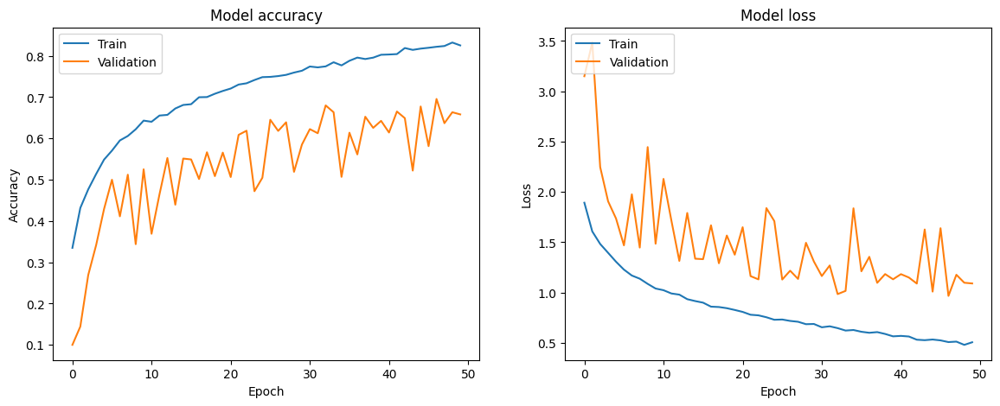

In [ ]:
#Improved model: 4CNN + 3PL + 0D + BN + 50
# 4 Convolutional layers
# Define the CNN model
model_Best = Sequential()

# Convolution Layer 1
model_Best.add(Conv2D(32, (3, 3), input_shape=(img_height, img_width, 3)))
model_Best.add(BatchNormalization(axis=-1))
model_Best.add(Activation('relu'))
model_Best.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 2
model_Best.add(Conv2D(64, (3, 3)))
model_Best.add(BatchNormalization(axis=-1))
model_Best.add(Activation('relu'))
model_Best.add(MaxPooling2D(pool_size=(2, 2)))

# Convolution Layer 3
model_Best.add(Conv2D(64, (3, 3)))
model_Best.add(BatchNormalization(axis=-1))
model_Best.add(Activation('relu'))

# Convolution Layer 4
model_Best.add(Conv2D(128, (3, 3)))
model_Best.add(BatchNormalization(axis=-1))
model_Best.add(Activation('relu'))
model_Best.add(MaxPooling2D(pool_size=(2, 2)))
model_Best.add(Flatten())

# Fully Connected Layer 5
model_Best.add(Dense(128))
model_Best.add(BatchNormalization())
model_Best.add(Activation('relu'))

# Fully Connected Layer 6
model_Best.add(Dense(len(translate)))
model_Best.add(Activation('softmax'))

# Compile the model
model_Best.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Print the model summary
model_Best.summary()

# Train the model
history = model_Best.fit(
    train_images,
    validation_data=validation_images,
    epochs=50
)

# Evaluate the model on the test data
evaluation = model_Best.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()


45/45 ━━━━━━━━━━━━━━━━━━━━ 9s 170ms/step


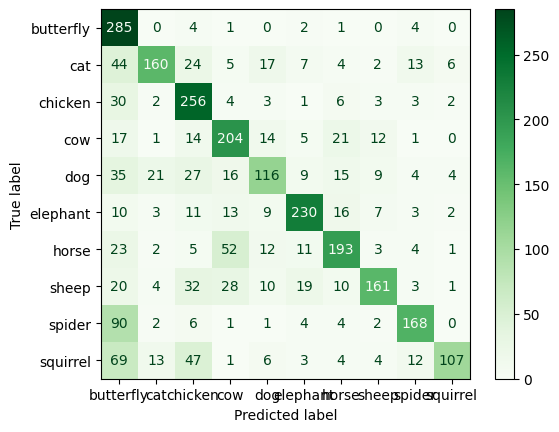

In [ ]:
# Show confusion Matrix
# Get the true labels and the predicted labels
y_true = test_images.classes
y_pred = model_Best.predict(test_images)
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_images.class_indices.keys())
disp.plot(cmap=plt.cm.Greens)
plt.show()

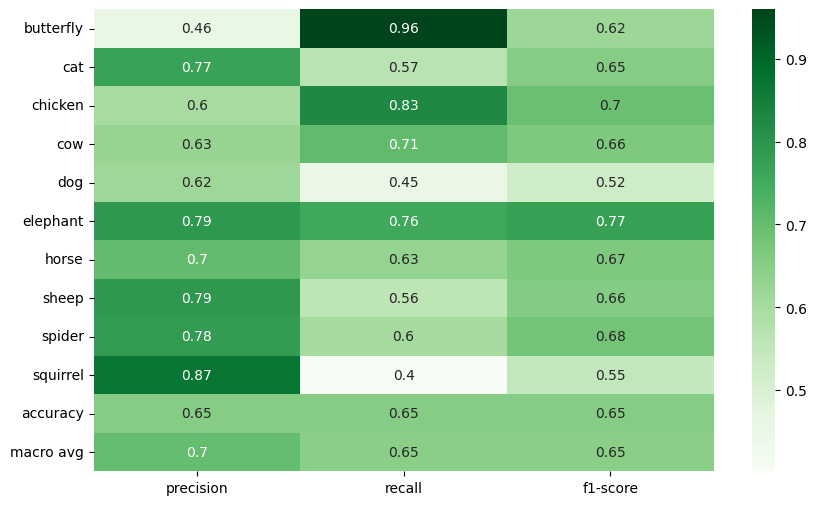

In [ ]:
# Classification report
# Generate the classification report
report = classification_report(y_true, y_pred_classes, target_names=list(test_images.class_indices.keys()), output_dict=True)

# Convert the report to a DataFrame
report_df = pd.DataFrame(report).transpose()

# Plot the classification report
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap='Greens')
plt.show()

## 3.5 Using transfer learning: EfficientNetB7

In [2]:
# Import Data Science Libraries
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
import itertools
import random

# Import visualization libraries
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2
import seaborn as sns

# Tensorflow Libraries
from tensorflow import keras
from tensorflow.keras import layers,models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam

# System libraries
from pathlib import Path
import os.path

# Metrics
from sklearn.metrics import classification_report, confusion_matrix


In [6]:
BATCH_SIZE = 32
TARGET_SIZE = (224, 224)
image_df = convert_path_to_df(dataset)

# Get the value counts for each label
label_counts = image_df['Label'].value_counts()

In [7]:
# Separate in train and test data
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

In [8]:
train_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    validation_split=0.2
)

test_generator = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
)

In [9]:
# Split the data into three categories.
train_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='training'
)

val_images = train_generator.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    subset='validation'
)

test_images = test_generator.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',
    y_col='Label',
    target_size=TARGET_SIZE,
    color_mode='rgb',
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False
)

Found 16722 validated image filenames belonging to 10 classes.
Found 4180 validated image filenames belonging to 10 classes.
Found 5226 validated image filenames belonging to 10 classes.


In [10]:
# Data Augmentation Step
augment = tf.keras.Sequential([
  layers.Resizing(224,224),
  layers.Rescaling(1./255),
  layers.RandomFlip("horizontal"),
  layers.RandomRotation(0.1),
  layers.RandomZoom(0.1),
  layers.RandomContrast(0.1),
])

In [11]:
# Load the pretained model
pretrained_model = tf.keras.applications.efficientnet.EfficientNetB7(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='imagenet',
    pooling='max'
)

pretrained_model.trainable = False

258076736/258076736 ━━━━━━━━━━━━━━━━━━━━ 7s 0us/step


In [12]:
# Create checkpoint callback
checkpoint_path = "animals_classification_model_checkpoint.weights.h5"
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

# Setup EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
early_stopping = EarlyStopping(monitor = "val_loss", # watch the val loss metric
                               patience = 5,
                               restore_best_weights = True) # if val loss decreases for 3 epochs in a row, stop training

reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)

In [13]:
inputs = pretrained_model.input

x = Dense(128, activation='relu')(pretrained_model.output)
x = BatchNormalization()(x)
x = Dropout(0.45)(x)
x = Dense(256, activation='relu')(x)
x = BatchNormalization()(x)
x = Dropout(0.45)(x)


outputs = Dense(10, activation='softmax')(x)

model = Model(inputs=inputs, outputs=outputs)

model.compile(
    optimizer=Adam(0.00001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [14]:
history = model.fit(
    train_images,
    validation_data=val_images,
    epochs=20
)

Epoch 1/20


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


523/523 ━━━━━━━━━━━━━━━━━━━━ 329s 450ms/step - accuracy: 0.1669 - loss: 3.0533 - val_accuracy: 0.7012 - val_loss: 1.0613
Epoch 2/20
523/523 ━━━━━━━━━━━━━━━━━━━━ 156s 298ms/step - accuracy: 0.4779 - loss: 1.6788 - val_accuracy: 0.8507 - val_loss: 0.6145
Epoch 3/20
523/523 ━━━━━━━━━━━━━━━━━━━━ 159s 304ms/step - accuracy: 0.6403 - loss: 1.1471 - val_accuracy: 0.9017 - val_loss: 0.4243
Epoch 4/20
523/523 ━━━━━━━━━━━━━━━━━━━━ 200s 300ms/step - accuracy: 0.7334 - loss: 0.8685 - val_accuracy: 0.9232 - val_loss: 0.3324
Epoch 5/20
523/523 ━━━━━━━━━━━━━━━━━━━━ 202s 299ms/step - accuracy: 0.7933 - loss: 0.6862 - val_accuracy: 0.9342 - val_loss: 0.2783
Epoch 6/20
523/523 ━━━━━━━━━━━━━━━━━━━━ 211s 318ms/step - accuracy: 0.8288 - loss: 0.5818 - val_accuracy: 0.9411 - val_loss: 0.2421
Epoch 7/20
523/523 ━━━━━━━━━━━━━━━━━━━━ 159s 303ms/step - accuracy: 0.8562 - loss: 0.5071 - val_accuracy: 0.9447 - val_loss: 0.2177
Epoch 8/20
523/523 ━━━━━━━━━━━━━━━━━━━━ 161s 306ms/step - accuracy: 0.8689 - loss: 0.45

164/164 ━━━━━━━━━━━━━━━━━━━━ 62s 375ms/step - accuracy: 0.9683 - loss: 0.1091
Test Loss: 0.11500383913516998
Test Accuracy: 0.9661309123039246


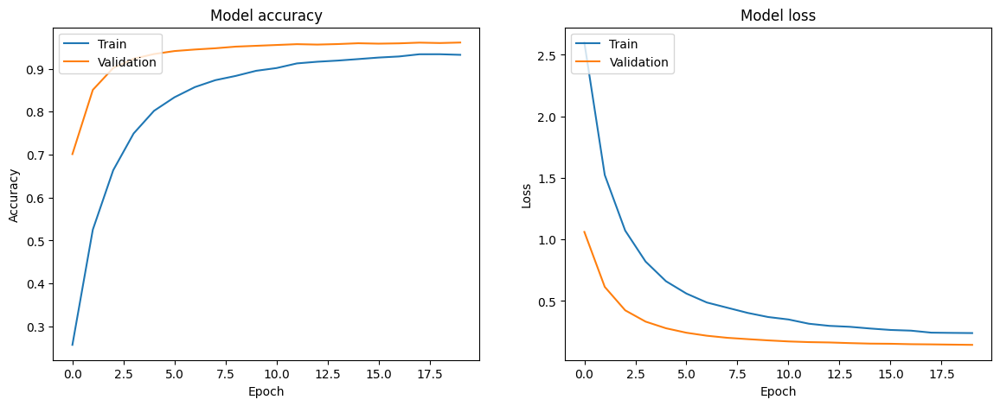

In [15]:
# Evaluate the model on the test data
evaluation = model.evaluate(test_images)
print(f"Test Loss: {evaluation[0]}")
print(f"Test Accuracy: {evaluation[1]}")

# Plot accuracy and loss curves
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

# Plot training & validation accuracy values
ax1.plot(history.history['accuracy'])
ax1.plot(history.history['val_accuracy'])
ax1.set_title('Model accuracy')
ax1.set_ylabel('Accuracy')
ax1.set_xlabel('Epoch')
ax1.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
ax2.plot(history.history['loss'])
ax2.plot(history.history['val_loss'])
ax2.set_title('Model loss')
ax2.set_ylabel('Loss')
ax2.set_xlabel('Epoch')
ax2.legend(['Train', 'Validation'], loc='upper left')

plt.show()

164/164 ━━━━━━━━━━━━━━━━━━━━ 35s 212ms/step


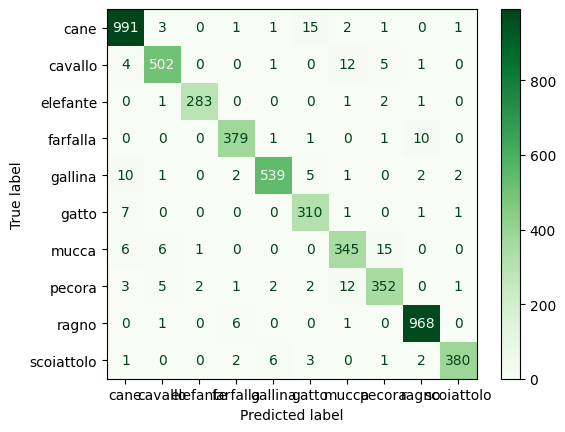

In [19]:
# Show confusion Matrix
# Get the true labels and the predicted labels
y_true = test_images.classes
y_pred = model.predict(test_images)
y_pred_classes = np.argmax(y_pred, axis=1)

# Create the confusion matrix
cm = confusion_matrix(y_true, y_pred_classes)

# Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_images.class_indices.keys())
disp.plot(cmap=plt.cm.Greens)
plt.show()

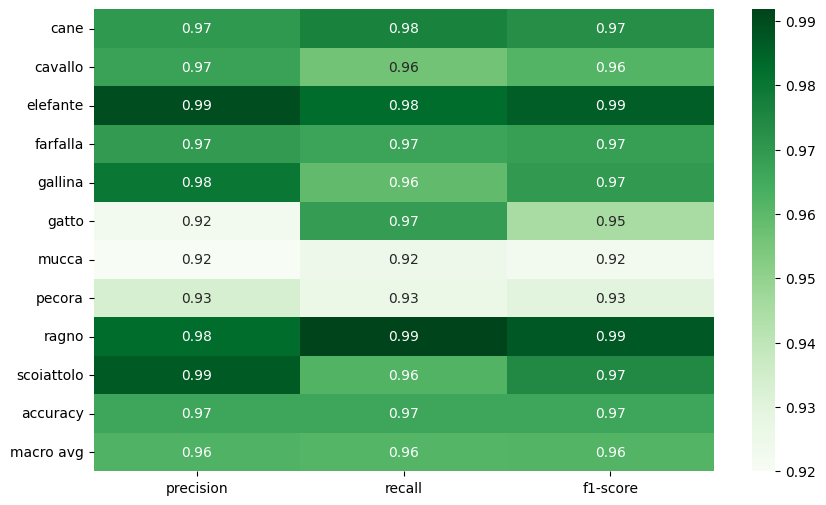

In [20]:
# Classification report
# Generate the classification report
report = classification_report(y_true, y_pred_classes, target_names=list(test_images.class_indices.keys()), output_dict=True)

# Convert the report to a DataFrame
report_df = pd.DataFrame(report).transpose()

# Plot the classification report
plt.figure(figsize=(10, 6))
sns.heatmap(report_df.iloc[:-1, :-1], annot=True, cmap='Greens')
plt.show()